In [369]:
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import plotly.express as px
%matplotlib inline
import matplotlib.pyplot as plt
from plotly.offline import download_plotlyjs, init_notebook_mode,plot,iplot
init_notebook_mode(connected=True)
from sklearn.model_selection import train_test_split
from sklearn import tree

archivo = "bitcoin.csv"

In [370]:
datos = pd.read_csv(archivo)
datos.head()

,Block_Hash,Block_Height,Block_Time_UNIX,Is_Coinbase?,Value_Sat,Difficulty,Hash_Rate,Price,Number_of_Halvings,Block_Time,Value_BTC,Miner_Revenue,Block_Reward_BTC,Transaction_Fees_BTC,Transaction_Fee_Percent
0,000000000019d6689c085ae165831e934ff763ae46a2a6...,0,1231006505,True,5000000000,1.0,4.971027e-08,0.0,0,2009-01-03T18:15:05Z,50.0,0.0,50.0,0.0,0.0
1,000000007bc154e0fa7ea32218a72fe2c1bb9f86cf8c9e...,100,1231660825,True,5000000000,1.0,6.959438e-07,0.0,0,2009-01-11T08:00:25Z,50.0,0.0,50.0,0.0,0.0
2,000000008f1a7008320c16b8402b7f11e82951f44ca266...,200,1231753120,True,5000000000,1.0,4.424214e-06,0.0,0,2009-01-12T09:38:40Z,50.0,0.0,50.0,0.0,0.0
3,0000000062b69e4a2c3312a5782d7798b0711e9ebac065...,300,1231832435,True,5000000000,1.0,4.424214e-06,0.0,0,2009-01-13T07:40:35Z,50.0,0.0,50.0,0.0,0.0
4,000000002dd9919f0a67590bb7c945cb57270a060ce39e...,400,1231902179,True,5000000000,1.0,4.424214e-06,0.0,0,2009-01-14T03:02:59Z,50.0,0.0,50.0,0.0,0.0


In [8]:
datos.columns

Index(['Block_Hash', 'Block_Height', 'Block_Time_UNIX', 'Is_Coinbase?',
       'Value_Sat', 'Difficulty', 'Hash_Rate', 'Price', 'Number_of_Halvings',
       'Block_Time', 'Value_BTC', 'Miner_Revenue', 'Block_Reward_BTC',
       'Transaction_Fees_BTC', 'Transaction_Fee_Percent'],
      dtype='object')

In [9]:
datos.isnull().sum()

Block_Hash                 0
Block_Height               0
Block_Time_UNIX            0
Is_Coinbase?               0
Value_Sat                  0
Difficulty                 0
Hash_Rate                  0
Price                      0
Number_of_Halvings         0
Block_Time                 0
Value_BTC                  0
Miner_Revenue              0
Block_Reward_BTC           0
Transaction_Fees_BTC       0
Transaction_Fee_Percent    0
dtype: int64

In [15]:
datos.tail(10)

,Block_Hash,Block_Height,Block_Time_UNIX,Is_Coinbase?,Value_Sat,Difficulty,Hash_Rate,Price,Number_of_Halvings,Block_Time,Value_BTC,Miner_Revenue,Block_Reward_BTC,Transaction_Fees_BTC,Transaction_Fee_Percent
6692,0000000000000000000bfc53c0efa183669f89ea729455...,669200,1612518980,True,759742996,2.082353e+13,1.749392e+08,37492.69,3,2021-02-05T09:56:20Z,7.597430,284848.09,6.25,1.347430,17.735339
6693,000000000000000000097ce1d31267fabb8db6cac40912...,669300,1612571771,True,765762967,2.082353e+13,1.749392e+08,38610.00,3,2021-02-06T00:36:11Z,7.657630,295661.08,6.25,1.407630,18.382055
6694,00000000000000000000a027b1837c4860f63655f51251...,669400,1612628254,True,710778415,2.082353e+13,1.749392e+08,40818.21,3,2021-02-06T16:17:34Z,7.107784,290127.03,6.25,0.857784,12.068236
6695,000000000000000000061a97b8e4567211c245478949ad...,669500,1612683443,True,651358964,2.082353e+13,1.749392e+08,38825.33,3,2021-02-07T07:37:23Z,6.513590,252892.27,6.25,0.263590,4.046765
6696,00000000000000000006f93dbd75d8c2f8df50d79ac5a0...,669600,1612737894,True,732674207,2.082353e+13,1.749392e+08,38479.63,3,2021-02-07T22:44:54Z,7.326742,281930.32,6.25,1.076742,14.696055
6697,0000000000000000000b4c1c805cfeb2cee6e0ba20309a...,669700,1612791692,True,710624895,2.143440e+13,1.726126e+08,44335.29,3,2021-02-08T13:41:32Z,7.106249,315057.61,6.25,0.856249,12.049239
6698,000000000000000000068b9429e6a7c559782de3e01bdf...,669800,1612845552,True,756409177,2.143440e+13,1.726126e+08,46505.39,3,2021-02-09T04:39:12Z,7.564092,351771.04,6.25,1.314092,17.372763
6699,00000000000000000002330551f1b6c3e7f5ee556c7399...,669900,1612905409,True,783543436,2.143440e+13,1.726126e+08,47224.32,3,2021-02-09T21:16:49Z,7.835434,370023.06,6.25,1.585434,20.234160
6700,0000000000000000000411ab5253403532ca82aa6cfe16...,670000,1612962571,True,781437645,2.143440e+13,1.726126e+08,45767.04,3,2021-02-10T13:09:31Z,7.814376,357640.88,6.25,1.564376,20.019210
6701,00000000000000000000a66e5af017d24354eb68c8ed54...,670100,1613027588,True,771835549,2.143440e+13,1.374507e+08,44822.10,3,2021-02-11T07:13:08Z,7.718355,345952.90,6.25,1.468355,19.024201


## Graficas

### Se evalúan varias gráficas para observar el comportamiento general de cada columna


#### Grafica 1 Valor_Satoshi vs Tiempo


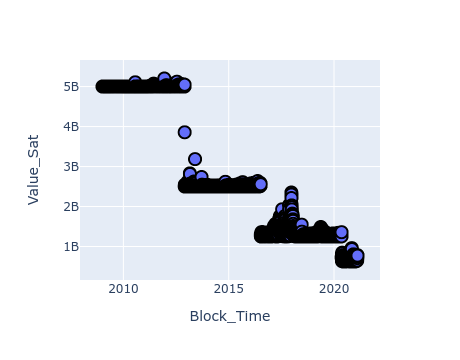

In [4]:
grafica = px.scatter(datos, x="Block_Time", y="Value_Sat")
grafica.update_traces(marker=dict(size=12,line=dict(width=2,color='DarkSlateGrey')),selector=dict(mode='markers'))
grafica.show()
##grafica.write_image("figure.png", engine="kaleido")


#### Grafica 2 Valor_Bitcoin vs Tiempo

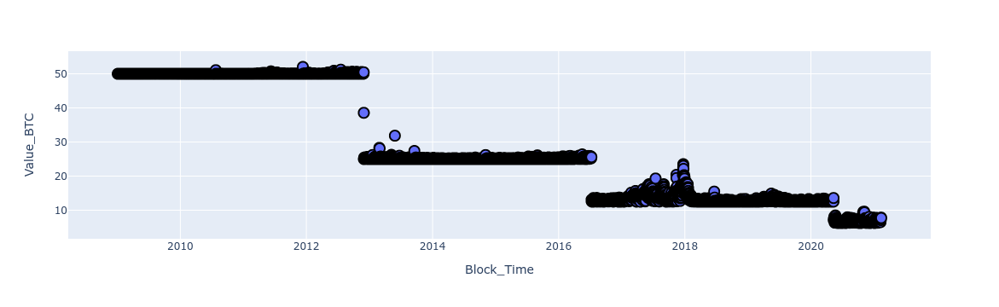

In [5]:
grafica2 = px.scatter(datos, x="Block_Time", y="Value_BTC")
grafica2.update_traces(marker=dict(size=12,line=dict(width=2,color='DarkSlateGrey')),selector=dict(mode='markers'))
grafica2.show()


#### Grafica 3 Recompensa vs Tiempo


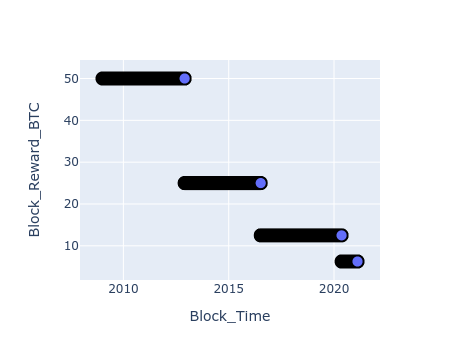

In [6]:
grafica3 = px.scatter(datos, x="Block_Time", y="Block_Reward_BTC")
grafica3.update_traces(marker=dict(size=12,line=dict(width=2,color='DarkSlateGrey')),selector=dict(mode='markers'))
grafica3.show()


#### Grafica 4 Comisiones vs Tiempo


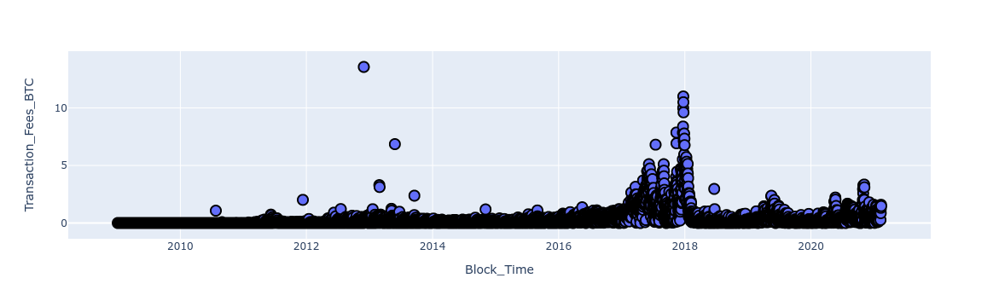

In [7]:
grafica4 = px.scatter(datos, x="Block_Time", y="Transaction_Fees_BTC")
grafica4.update_traces(marker=dict(size=12,line=dict(width=2,color='DarkSlateGrey')),selector=dict(mode='markers'))
grafica4.show()


#### Grafica 5 Valor_bitcoin vs Precio


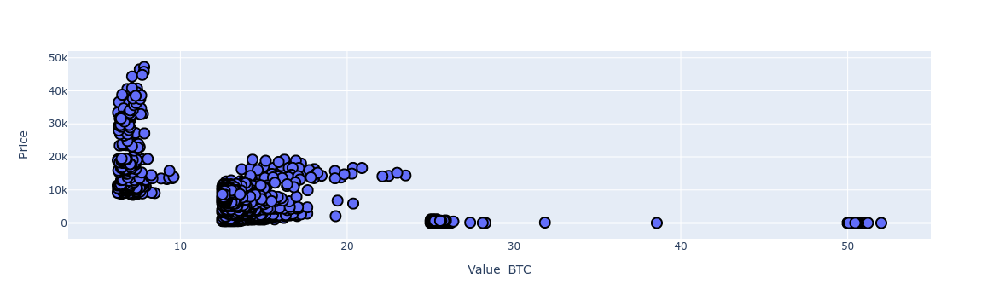

In [8]:
grafica5 = px.scatter(datos, x="Value_BTC", y="Price")
grafica5.update_traces(marker=dict(size=12,line=dict(width=2,color='DarkSlateGrey')),selector=dict(mode='markers'))
grafica5.show()


#### Grafica 6 valor BTC vs Recompensa


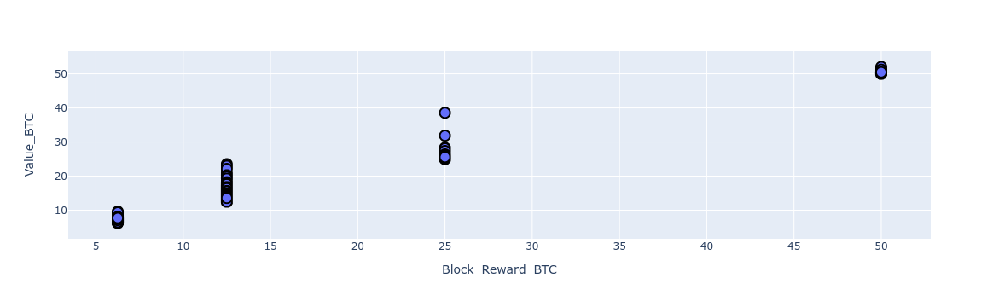

In [10]:
grafica6 = px.scatter(datos, x="Block_Reward_BTC", y="Value_BTC")
grafica6.update_traces(marker=dict(size=12,line=dict(width=2,color='DarkSlateGrey')),selector=dict(mode='markers'))
grafica6.show()


#### Gráfica 7 Hash_Rate vs Difficulty

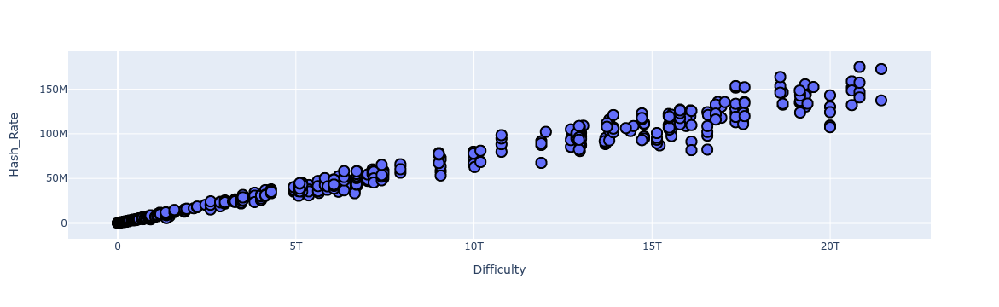

In [11]:
grafica7 = px.scatter(datos, x="Difficulty", y="Hash_Rate")
grafica7.update_traces(marker=dict(size=12,line=dict(width=2,color='DarkSlateGrey')),selector=dict(mode='markers'))
grafica7.show()


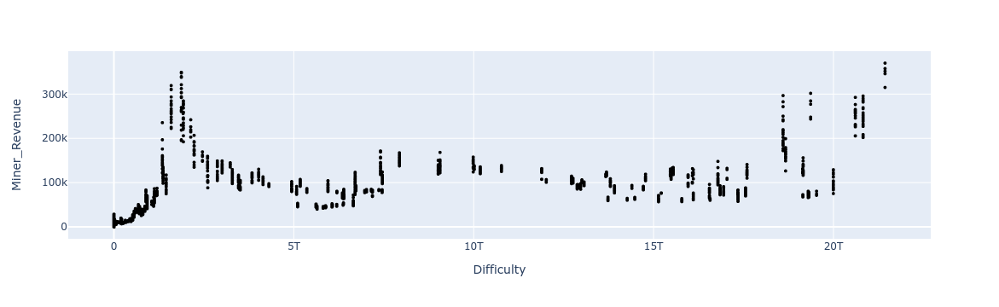

In [37]:
grafica = px.scatter(datos,x ="Difficulty", y ="Miner_Revenue")
grafica.update_traces(marker=dict(size=2,
                                  line=dict(width = 2,
                                            color="DarkSlategray")),
                      selector=dict(mode="markers"))

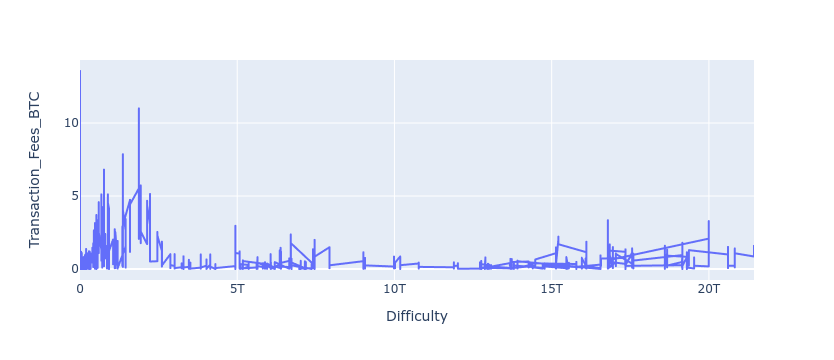

In [40]:
grafica = px.line(datos,x ="Difficulty", y ="Transaction_Fees_BTC")
grafica.update_traces(marker=dict(size=2,
                                  line=dict(width = 2,
                                            color="DarkSlategray")),
                      selector=dict(mode="markers"))

### Esto tambien se puede realizar de la siguiente manera:

In [62]:
columnas = ["Difficulty","Value_BTC","Miner_Revenue"]
X = datos[columnas].values
y = datos.iloc[:,4].values

## Datos de entreno

In [63]:
X_entreno, X_prueba, y_entreno, y_prueba = train_test_split(X, y, test_size=0.2)

In [64]:
print('Hay {} muestras en el conjunto de entrenamiento y {} muestras en el conjunto de pruebas (validacion)'.format(X_entreno.shape[0],X_prueba.shape[0]))

Hay 5361 muestras en el conjunto de entrenamiento y 1341 muestras en el conjunto de pruebas (validacion)


# Implementacion de modelo KNN

In [65]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_entreno, y_entreno)

KNeighborsClassifier()

In [66]:
error = []
for i in range(1, 30):
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(X_entreno, y_entreno)
    pred_i = knn.predict(X_prueba)
    error.append(np.mean(pred_i != y_prueba))

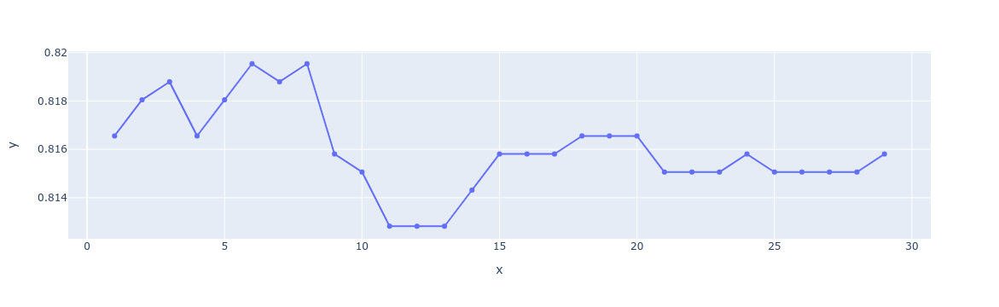

In [67]:
grafica4 = px.line(x=range(1,30), y =error, markers=True)
grafica4.show()

In [68]:
from sklearn.metrics import accuracy_score

clf = KNeighborsClassifier(n_neighbors=11)

clf.fit(X_entreno, y_entreno)

y_prediccion = clf.predict(X_prueba)

precision = accuracy_score(y_prueba, y_prediccion)*100

print('La precisión de nuestro modelo es: ' + str(round(precision, 2)) + ' %.')

La precisión de nuestro modelo es: 18.72 %.


# PCA analysis

### Standarize the data

In [373]:
datos.head()

,Block_Hash,Block_Height,Block_Time_UNIX,Is_Coinbase?,Value_Sat,Difficulty,Hash_Rate,Price,Number_of_Halvings,Block_Time,Value_BTC,Miner_Revenue,Block_Reward_BTC,Transaction_Fees_BTC,Transaction_Fee_Percent
0,000000000019d6689c085ae165831e934ff763ae46a2a6...,0,1231006505,True,5000000000,1.0,4.971027e-08,0.0,0,2009-01-03T18:15:05Z,50.0,0.0,50.0,0.0,0.0
1,000000007bc154e0fa7ea32218a72fe2c1bb9f86cf8c9e...,100,1231660825,True,5000000000,1.0,6.959438e-07,0.0,0,2009-01-11T08:00:25Z,50.0,0.0,50.0,0.0,0.0
2,000000008f1a7008320c16b8402b7f11e82951f44ca266...,200,1231753120,True,5000000000,1.0,4.424214e-06,0.0,0,2009-01-12T09:38:40Z,50.0,0.0,50.0,0.0,0.0
3,0000000062b69e4a2c3312a5782d7798b0711e9ebac065...,300,1231832435,True,5000000000,1.0,4.424214e-06,0.0,0,2009-01-13T07:40:35Z,50.0,0.0,50.0,0.0,0.0
4,000000002dd9919f0a67590bb7c945cb57270a060ce39e...,400,1231902179,True,5000000000,1.0,4.424214e-06,0.0,0,2009-01-14T03:02:59Z,50.0,0.0,50.0,0.0,0.0


In [375]:
datos['Value_BTC1'] = datos['Value_BTC'].astype(int)
datos['Value_BTC1'].info()
datos['Value_BTC1'] = pd.to_numeric(datos['Value_BTC1'])

<class 'pandas.core.series.Series'>
RangeIndex: 6702 entries, 0 to 6701
Series name: Value_BTC1
Non-Null Count  Dtype
--------------  -----
6702 non-null   int64
dtypes: int64(1)
memory usage: 52.5 KB


In [291]:
del datos['Value_BTC_PCA']

In [376]:
Value_BTC_PCA = pd.cut(datos.Value_BTC1,bins = [0,10,20,30,40,50,60],labels = [10,20,30,40,50,60])


In [377]:
datos.insert(7,'Value_BTC_PCA',Value_BTC_PCA)

In [378]:
datos['Value_BTC_PCA'].value_counts(normalize=True)

30    0.313638
50    0.312892
20    0.312742
10    0.059982
60    0.000448
40    0.000298
Name: Value_BTC_PCA, dtype: float64

In [379]:
datos.head()

,Block_Hash,Block_Height,Block_Time_UNIX,Is_Coinbase?,Value_Sat,Difficulty,Hash_Rate,Value_BTC_PCA,Price,Number_of_Halvings,Block_Time,Value_BTC,Miner_Revenue,Block_Reward_BTC,Transaction_Fees_BTC,Transaction_Fee_Percent,Value_BTC1
0,000000000019d6689c085ae165831e934ff763ae46a2a6...,0,1231006505,True,5000000000,1.0,4.971027e-08,50,0.0,0,2009-01-03T18:15:05Z,50.0,0.0,50.0,0.0,0.0,50
1,000000007bc154e0fa7ea32218a72fe2c1bb9f86cf8c9e...,100,1231660825,True,5000000000,1.0,6.959438e-07,50,0.0,0,2009-01-11T08:00:25Z,50.0,0.0,50.0,0.0,0.0,50
2,000000008f1a7008320c16b8402b7f11e82951f44ca266...,200,1231753120,True,5000000000,1.0,4.424214e-06,50,0.0,0,2009-01-12T09:38:40Z,50.0,0.0,50.0,0.0,0.0,50
3,0000000062b69e4a2c3312a5782d7798b0711e9ebac065...,300,1231832435,True,5000000000,1.0,4.424214e-06,50,0.0,0,2009-01-13T07:40:35Z,50.0,0.0,50.0,0.0,0.0,50
4,000000002dd9919f0a67590bb7c945cb57270a060ce39e...,400,1231902179,True,5000000000,1.0,4.424214e-06,50,0.0,0,2009-01-14T03:02:59Z,50.0,0.0,50.0,0.0,0.0,50


In [380]:
datos[datos['Value_BTC_PCA'].isna()]

,Block_Hash,Block_Height,Block_Time_UNIX,Is_Coinbase?,Value_Sat,Difficulty,Hash_Rate,Value_BTC_PCA,Price,Number_of_Halvings,Block_Time,Value_BTC,Miner_Revenue,Block_Reward_BTC,Transaction_Fees_BTC,Transaction_Fee_Percent,Value_BTC1


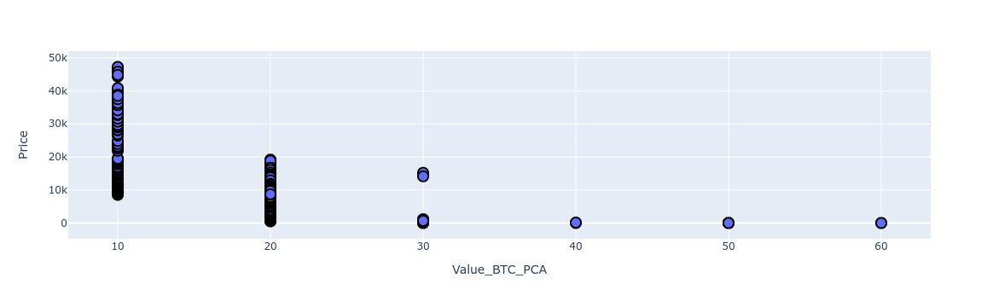

In [381]:
grafica5 = px.scatter(datos, x="Value_BTC_PCA", y="Price")
grafica5.update_traces(marker=dict(size=12,line=dict(width=2,color='DarkSlateGrey')),selector=dict(mode='markers'))
grafica5.show()

In [298]:
from sklearn.preprocessing import StandardScaler

features = ['Price', 'Miner_Revenue','Difficulty','Block_Reward_BTC']
# Separating out the features
X = datos.loc[:, features].values
# Separating out the target
y = datos.loc[:,['Value_BTC_PCA']].values


X_train_PCA, X_test_PCA, y_train_PCA, y_test_PCA = train_test_split(X, y, test_size=0.2, random_state=0)

In [303]:
sc = StandardScaler()
X_train_PCA = sc.fit_transform(X_train_PCA)
X_test_PCA = sc.transform(X_test_PCA)

In [300]:
from sklearn.decomposition import PCA

pca = PCA()
X_train_PCA = pca.fit_transform(X_train_PCA)
X_test_PCA = pca.transform(X_test_PCA)

In [269]:
explained_variance = pca.explained_variance_ratio_
explained_variance

array([0.78220596, 0.12851124, 0.07593085, 0.01335195])

In [403]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
X_train_PCA = pca.fit_transform(X_train_PCA)
X_test_PCA = pca.transform(X_test_PCA)
explained_variance = pca.explained_variance_ratio_
explained_variance

array([0.5, 0.5])

In [305]:

# Fitting Logistic Regression To the training set
from sklearn.linear_model import LogisticRegression 
log_model = LogisticRegression(solver='lbfgs', max_iter=1000000)
 
classifier = LogisticRegression(random_state = 0)
classifier.fit(X_train_PCA, y_train_PCA.ravel())

LogisticRegression(random_state=0)

In [306]:

# Predicting the test set result using
# predict function under LogisticRegression
y_pred = classifier.predict(X_test_PCA)

In [353]:

# making confusion matrix between
#  test set of Y and predicted value.
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
 
cm = confusion_matrix(y_test_PCA, y_pred)
y_train_PCA

print(cm)
accuracy = accuracy_score(y_test_PCA, y_pred)
print(accuracy)

[[ 84   0   0   0   0   0]
 [  5 425   0   0   0   0]
 [  1   0 425   0   0   0]
 [  0   0   2   0   0   0]
 [  0   0   0   0 398   0]
 [  0   0   0   0   1   0]]
0.9932885906040269


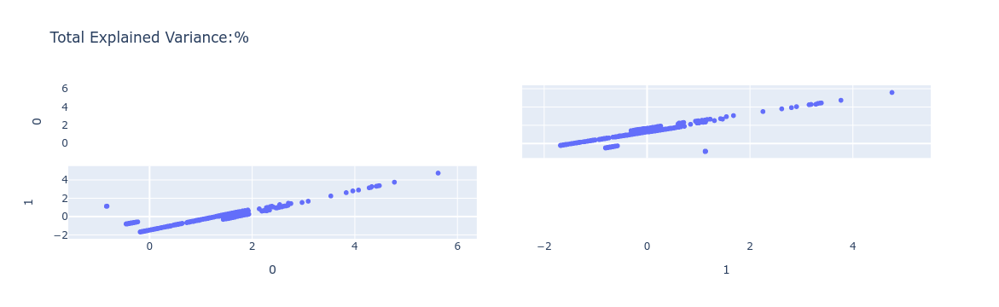

In [423]:
fig = px.scatter_matrix(
    X_test_PCA,
    dimensions=range(2),
    title=f'Total Explained Variance:%'
)
fig.update_traces(diagonal_visible=False)
fig.show()

In [383]:
datos['Price']

0           0.00
1           0.00
2           0.00
3           0.00
4           0.00
          ...   
6697    44335.29
6698    46505.39
6699    47224.32
6700    45767.04
6701    44822.10
Name: Price, Length: 6702, dtype: float64

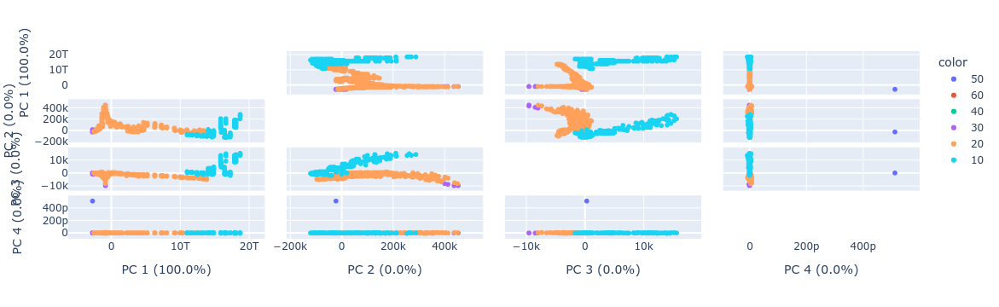

In [386]:

features = ["Price", "Miner_Revenue", "Difficulty","Miner_Revenue"]
pca = PCA()
components = pca.fit_transform(datos[features])
labels = {
    str(i): f"PC {i+1} ({var:.1f}%)"
    for i, var in enumerate(pca.explained_variance_ratio_ * 100)
}

fig = px.scatter_matrix(
    components,
    labels=labels,
    dimensions=range(4),
    color=datos["Value_BTC_PCA"]
)
fig.update_traces(diagonal_visible=False)
fig.show()

In [398]:
X = datos[["Price", "Miner_Revenue", "Difficulty","Miner_Revenue"]]

pca = PCA(n_components=3)
components = pca.fit_transform(X)

total_var = pca.explained_variance_ratio_.sum() * 100

fig = px.scatter_3d(
    components, x=0, y=1, z=2, color=datos['Value_BTC_PCA'],
    title=f'Total Explained Variance: {total_var:.2f}%',
    labels={'0': 'PC 1', '1': 'PC 2', '2': 'PC 3'}
)
fig.show()

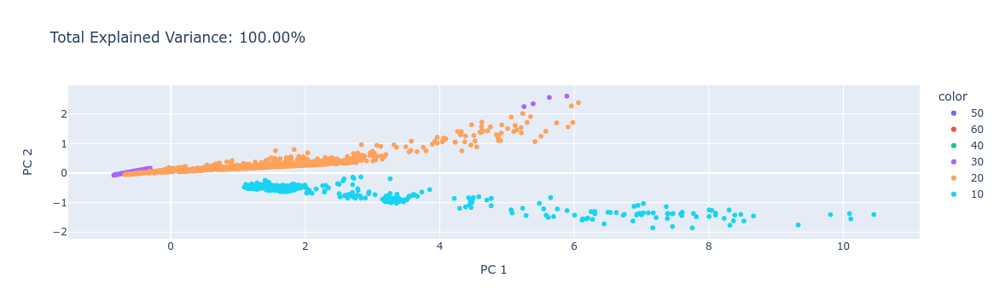

In [414]:
from sklearn.preprocessing import StandardScaler
X = datos[["Price", "Miner_Revenue"]]
sc = StandardScaler()
X= sc.fit_transform(X)

pca = PCA(n_components=2)
components = pca.fit_transform(X)

total_var = pca.explained_variance_ratio_.sum() * 100

fig = px.scatter(
    components, x=0, y=1, color=datos['Value_BTC_PCA'],
    title=f'Total Explained Variance: {total_var:.2f}%',
    labels={'0': 'PC 1', '1': 'PC 2'}
)
fig.show()


In [412]:

def draw_vector(v0, v1, ax=None):
    ax = ax or plt.gca()
    arrowprops=dict(arrowstyle='->',
                    linewidth=2,
                    shrinkA=0, shrinkB=0)
    ax.annotate('', v1, v0, arrowprops=arrowprops)

# plot data
px.scatter(X[:, 1], X[:, 200000], alpha=0.2)
for length, vector in zip(pca.explained_variance_, pca.components_):
    v = vector * 3 * np.sqrt(length)
    draw_vector(pca.mean_, pca.mean_ + v)
plt.axis('equal');

InvalidIndexError: (slice(None, None, None), 1)

# K-Meanns

In [ ]:
del datos['Block_Hash']
del datos['Block_Height']
del datos['Is_Coinbase?']
del datos['Block_Time']

In [60]:
X = datos
columnas= ['Price']
y = datos[columnas].values

X_entreno, X_prueba, y_entreno, y_prueba = train_test_split(X, y, test_size=0.2) 

print('Hay {} muestras en el conjunto de entrenamiento y {} muestras en el conjunto de pruebas (validaciÃ³n)'.format(X_entreno.shape[0], X_prueba.shape[0]))


Hay 5361 muestras en el conjunto de entrenamiento y 1341 muestras en el conjunto de pruebas (validaciÃ³n)


## Importamos la libreria para KMeans

In [61]:
from sklearn.cluster import KMeans

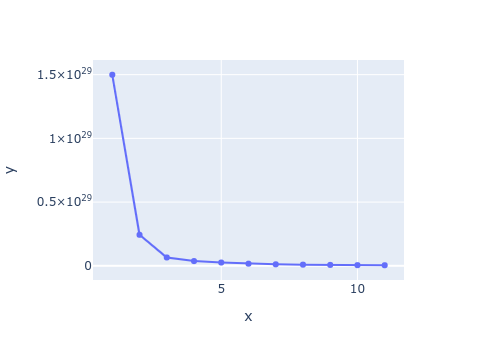

In [62]:
marca = []
for i in range(1, 12):
    km = KMeans(n_clusters=i)
    km.fit(X_entreno)
    marca.append(km.inertia_)

grafica8 = px.line(x=range(1, 12),y=marca,  markers=True)
grafica8.show()


In [63]:
ncluster = 3

semilla = 0

In [64]:
km = KMeans(n_clusters=ncluster, random_state=semilla)
km.fit(X_entreno)

KMeans(n_clusters=3, random_state=0)

In [65]:
y_cluster_kmeans = km.predict(X_entreno)
y_cluster_kmeans

array([0, 0, 0, ..., 0, 2, 0], dtype=int32)

In [58]:
datos.columns

Index(['Block_Time_UNIX', 'Value_Sat', 'Difficulty', 'Hash_Rate', 'Price',
       'Number_of_Halvings', 'Value_BTC', 'Miner_Revenue', 'Block_Reward_BTC',
       'Transaction_Fees_BTC', 'Transaction_Fee_Percent'],
      dtype='object')

In [66]:
resultado=pd.DataFrame(X_entreno,columns=datos.columns)
resultado['ClusterKmeans'] = y_cluster_kmeans
resultado.head(20)

,Block_Time_UNIX,Value_Sat,Difficulty,Hash_Rate,Price,Number_of_Halvings,Value_BTC,Miner_Revenue,Block_Reward_BTC,Transaction_Fees_BTC,Transaction_Fee_Percent,ClusterKmeans
4021,1457655828,2502651880,1.584272e+11,1.299451e+06,416.00,1,25.026519,10411.03,25.00,0.026519,0.105963,0
3660,1437301029,2500000000,5.107637e+10,3.630799e+05,276.51,1,25.000000,6912.75,25.00,0.000000,0.000000,0
4629,1492801251,1434715409,5.208087e+11,4.323554e+06,1235.99,2,14.347154,17732.94,12.50,1.847154,12.874707,0
3928,1452503517,2542333330,1.038803e+11,8.210632e+05,444.57,1,25.423333,11302.45,25.00,0.423333,1.665137,0
2212,1360887268,2537568509,3.275465e+06,2.670317e+01,27.45,1,25.375685,696.56,25.00,0.375685,1.480492,0
1136,1300183992,5000000000,7.619262e+04,3.673929e-01,0.90,0,50.000000,45.00,50.00,0.000000,0.000000,0
4475,1484060935,1348837113,3.176884e+11,2.147763e+06,902.04,2,13.488371,12167.05,12.50,0.988371,7.327580,0
1016,1294479219,5000000000,1.630742e+04,1.556441e-01,0.32,0,50.000000,16.00,50.00,0.000000,0.000000,0
6018,1572534451,1299885870,1.369148e+13,9.052075e+07,9285.56,2,12.998859,120701.68,12.50,0.498859,3.837712,1
3305,1416276552,2503697466,3.960367e+10,2.953063e+05,388.30,1,25.036975,9721.86,25.00,0.036975,0.147680,0


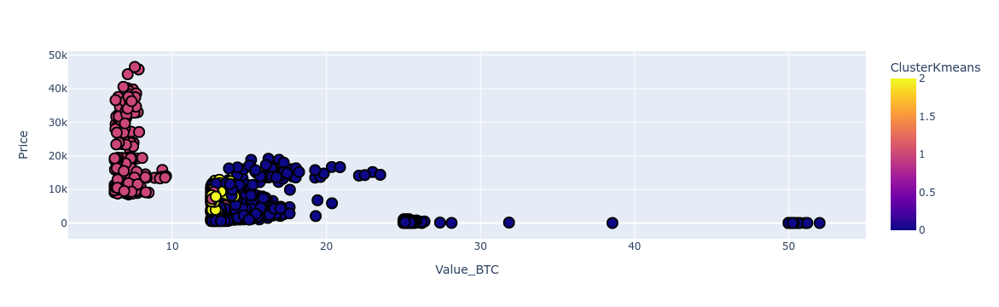

In [67]:
grafica9 = px.scatter(resultado, x="Value_BTC", y="Price", color='ClusterKmeans')
grafica9.update_traces(marker=dict(size=12,line=dict(width=2,color='DarkSlateGrey')),selector=dict(mode='markers'))
grafica9.show()